# Statement

## Goal:
---
The telecom operator Interconnect would like to be able to forecast their churn of clients.

### Key Question:
What factors or features will predict or determine customer churn?

### Stages:
- Task 1: Feature Engineering: Look into how each feature's relationship is to the target variable and apply neccessary transformations to capture those relationship
- Task 2: Handle Class Imbalance
- Task 3: Scale Features in Dataset
- Task 4: Train Various Classification models
- Task 5: Interpret Model Results/Select highest AUC-ROC score
- Task 6: Develop Conclusions based on insights


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from sklearn.model_selection import train_test_split, cross_validate, cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.utils import resample, shuffle
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import make_scorer, accuracy_score, roc_auc_score, auc
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
import lightgbm as lgb
import shap
from scipy.stats import randint, uniform

In [ ]:
contracts_df = pd.read_csv("/datasets/contract.csv") # file holds contract information
internet_df = pd.read_csv("/datasets/internet.csv") # file holds the client's personal information
personal_df = pd.read_csv("/datasets/personal.csv") # file holds the Internet services information
phone_df = pd.read_csv("/datasets/phone.csv") # file holds telephone services information

In [ ]:
mass_df_encoded.head()

,seniorcitizen,enddate,monthlycharges,totalcharges,type_One year,type_Two year,paperlessbilling_Yes,paymentmethod_Credit card (automatic),paymentmethod_Electronic check,paymentmethod_Mailed check,...,deviceprotection_Yes,techsupport_Yes,streamingtv_Yes,streamingmovies_Yes,gender_Male,partner_Yes,dependents_Yes,multiplelines_Yes,beginmonth,beginyear
0,0,0,29.85,29.85,0,0,1,0,1,0,...,0,0,0,0,0,1,0,0,1,2020
1,0,0,56.95,1889.50,1,0,0,0,0,1,...,1,0,0,0,1,0,0,0,4,2017
2,0,1,53.85,108.15,0,0,1,0,0,1,...,0,0,0,0,1,0,0,0,10,2019
3,0,0,42.30,1840.75,1,0,0,0,0,0,...,1,1,0,0,1,0,0,0,5,2016
4,0,1,70.70,151.65,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,9,2019


### Splitting dataset into training, validation, test set

In [ ]:
#splitting dataset into training, validation and test sets for encoded dataset
train_encoded, rem = train_test_split(mass_df_encoded, test_size= 0.4, random_state=42)
valid_encoded, test_encoded = train_test_split(rem, test_size=0.5, random_state=42)

#splitting dataset into training, validation and test sets for regular dataset
train, rem = train_test_split(mass_df, test_size= 0.4, random_state=42)
valid, test = train_test_split(rem, test_size=0.5, random_state=42)

In [ ]:
valid_encoded.head()

,seniorcitizen,enddate,monthlycharges,totalcharges,type_One year,type_Two year,paperlessbilling_Yes,paymentmethod_Credit card (automatic),paymentmethod_Electronic check,paymentmethod_Mailed check,...,deviceprotection_Yes,techsupport_Yes,streamingtv_Yes,streamingmovies_Yes,gender_Male,partner_Yes,dependents_Yes,multiplelines_Yes,beginmonth,beginyear
216,0,0,45.25,3139.80,0,1,0,1,0,0,...,1,1,0,0,1,1,1,0,2,2014
3007,1,1,74.40,2276.95,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,3,2017
3257,0,0,93.20,2157.30,0,0,1,0,0,1,...,0,0,1,1,1,0,0,0,4,2018
2444,1,1,99.95,3186.65,0,0,1,0,1,0,...,0,0,1,1,0,0,0,1,5,2017
6605,1,1,110.90,7432.05,1,0,0,1,0,0,...,1,1,1,1,1,0,0,1,6,2014


### Class Imbalance

0    0.730979
1    0.269021
Name: enddate, dtype: float64
0    3084
1    1135
Name: enddate, dtype: int64


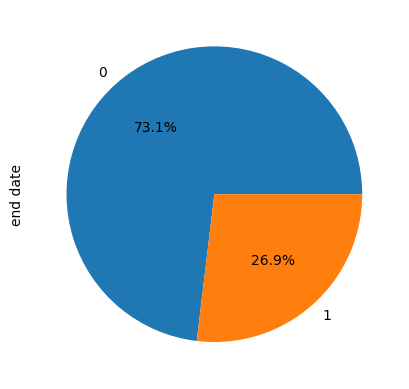

In [ ]:
# numerical/visual representation of composition of the class proportions before upsampling
train_encoded.groupby('enddate').size().plot(kind='pie', y='enddate', label='end date', autopct='%1.1f%%')
print(train_encoded['enddate'].value_counts(normalize = True)) # Check the target distribution
print(train_encoded['enddate'].value_counts())

In [ ]:
# upsampling used to address class imbalance in encoded dataset
majority = train_encoded[train_encoded['enddate'] == 0]
minority = train_encoded[train_encoded['enddate'] == 1 ]

minority_upsampled = resample(minority, replace=True, n_samples=len(majority), random_state=42) # Upsample minority class
# Combine majority class with upsampled minority class
train_us =pd.concat([majority, minority_upsampled])

0    0.5
1    0.5
Name: enddate, dtype: float64
0    3084
1    3084
Name: enddate, dtype: int64


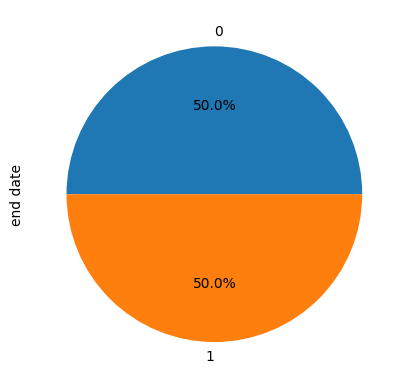

In [ ]:
# numerical/visual representation of composition of the class proportions before upsampling
train_us.groupby('enddate').size().plot(kind='pie', y='enddate', label='end date', autopct='%1.1f%%')
print(train_us['enddate'].value_counts(normalize = True)) # Check the target distribution
print(train_us['enddate'].value_counts())

### Splitting sets into features and target

In [ ]:
def split(set_name, columns_drop):
  train_y = set_name[columns_drop]
  train_x = set_name.drop(columns = columns_drop, axis=1)
  return train_x, train_y

In [ ]:
# Splitting training, validation, and test set into feature and target variables (encoded dataset)
x_train_encoded, y_train_encoded = split(train_us, 'enddate')
x_valid_encoded, y_valid_encoded = split(valid_encoded, 'enddate')
x_test_encoded, y_test_encoded = split(test_encoded, 'enddate')

# Splitting training, validation, and test set into feature and target variables (regular dataset)
x_train, y_train = split(train, 'enddate')
x_valid, y_valid = split(valid, 'enddate')
x_test, y_test = split(test, 'enddate')

### Scaling features

In [ ]:
numeric_features = ['monthlycharges', 'totalcharges', 'beginmonth', 'beginyear']

In [ ]:
#Scaling features for encoded dataset
scaler = StandardScaler()
x_train_encoded[numeric_features] = scaler.fit_transform(x_train_encoded[numeric_features])
x_valid_encoded[numeric_features] = scaler.transform(x_valid_encoded[numeric_features])
x_test_encoded[numeric_features] = scaler.transform(x_test_encoded[numeric_features])

In [ ]:
#info description of training, validating & test sets
print('training features:', x_train_encoded.shape)
print('training target:', y_train_encoded.shape)
print('validating features:', x_valid_encoded.shape)
print('validating target:', y_valid_encoded.shape)
print('test features:', x_test_encoded.shape)
print('test target:', y_test_encoded.shape)

training features: (6168, 22)
training target: (6168,)
validating features: (1406, 22)
validating target: (1406,)
test features: (1407, 22)
test target: (1407,)


### Model Training

In [ ]:
def train_pred_eval(model, train_x, train_y, valid_x, valid_y, test_x, test_y, cv_splits=5, **kwargs):
    # Initialize the model with optional hyperparameters
    model_instance = model(**kwargs)

    scoring = {'AUC-ROC': 'roc_auc', 'accuracy': 'accuracy'}  # Use built-in scoring metrics

    # Define K-Fold Cross-Validator
    kf = KFold(n_splits=cv_splits, shuffle=True, random_state=42)

    # Perform Cross-Validation
    cv_results = cross_validate(model_instance, train_x, train_y, cv=kf, scoring=scoring, return_train_score=False)
    print("Cross-Validation Results:")
    for metric, scores in cv_results.items():
        if 'test' in metric:  # Focus on test scores only
            print(f"{metric}: Mean = {np.mean(scores):.4f}, Std = {np.std(scores):.4f}")

    # Train the model
    model_instance.fit(train_x, train_y)

    # Validate the model
    pred_y_val = model_instance.predict(valid_x)
    pred_prob_val = model_instance.predict_proba(valid_x)[:, 1]  # Probability for AUC-ROC
    accuracy_val = accuracy_score(valid_y, pred_y_val)
    roc_auc_val = roc_auc_score(valid_y, pred_prob_val)
    print(f"Validation Accuracy: {accuracy_val:.4f}")
    print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

    # Test the model
    pred_y_test = model_instance.predict(test_x)
    pred_prob_test = model_instance.predict_proba(test_x)[:, 1]  # Probability for AUC-ROC
    accuracy_test = accuracy_score(test_y, pred_y_test)
    roc_auc_test = roc_auc_score(test_y, pred_prob_test)
    print(f"Test Accuracy: {accuracy_test:.4f}")
    print(f"Test AUC-ROC: {roc_auc_test:.4f}")

    return {
        'validation_accuracy': accuracy_val,
        'validation_auc_roc': roc_auc_val,
        'test_accuracy': accuracy_test,
        'test_auc_roc': roc_auc_test,
        'cv_results': cv_results
    }


### Logistic Regression

In [ ]:
train_pred_eval(LogisticRegression, x_train_encoded, y_train_encoded, x_valid_encoded, y_valid_encoded, x_test_encoded, y_test_encoded, cv_splits=5, random_state=42, max_iter=1000, class_weight='balanced')

Cross-Validation Results:
test_AUC-ROC: Mean = 0.8397, Std = 0.0133
test_accuracy: Mean = 0.7615, Std = 0.0160
Validation Accuracy: 0.7468
Validation AUC-ROC: 0.8217
Test Accuracy: 0.7406
Test AUC-ROC: 0.8432


{'validation_accuracy': 0.7467994310099573,
 'validation_auc_roc': 0.8216811214409018,
 'test_accuracy': 0.7405828002842928,
 'test_auc_roc': 0.8432155224827513,
 'cv_results': {'fit_time': array([0.11070752, 0.14241576, 0.09171534, 0.05787754, 0.07678819]),
  'score_time': array([0.04966712, 0.04306984, 0.02186394, 0.02233982, 0.02111292]),
  'test_AUC-ROC': array([0.82483256, 0.85132384, 0.84801978, 0.82229859, 0.85201974]),
  'test_accuracy': array([0.73581848, 0.78038898, 0.76580227, 0.75182482, 0.77372263])}}

In [ ]:
# Initialize the Logistic Regression model
model_lr = LogisticRegression(random_state=42, max_iter=10000)

# Define the hyperparameter grid
param_grid = {
    'penalty': ['l1'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga']
}


# Define K-Fold Cross-Validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize Grid Search with cross-validation
grid_search = GridSearchCV(estimator=model_lr, param_grid=param_grid, cv=kf, scoring='roc_auc', n_jobs=-1, verbose=2)

# Perform Grid Search
grid_search.fit(x_train_encoded, y_train_encoded)

# Get the best hyperparameters
best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# print the best parameters and score
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Score: {grid_search.best_score_:.4f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Hyperparameters: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
Best Parameters: {'C': 1, 'penalty': 'l1', 'solver': 'saga'}
Best Score: 0.8398


In [ ]:
# Initialize the model with the best hyperparameters
best_model_lr = LogisticRegression(**best_params, random_state=42, max_iter=10000)

# Train the model
best_model_lr.fit(x_train_encoded, y_train_encoded)

# Validate the model on validation data
pred_y_val = best_model_lr.predict(x_valid_encoded)
pred_prob_val = best_model_lr.predict_proba(x_valid_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid_encoded, pred_y_val)
roc_auc_val = roc_auc_score(y_valid_encoded, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = best_model_lr.predict(x_test_encoded)
pred_prob_test = best_model_lr.predict_proba(x_test_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test_encoded, pred_y_test)
roc_auc_test = roc_auc_score(y_test_encoded, pred_prob_test)

print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

Validation Accuracy: 0.7475
Validation AUC-ROC: 0.8217
Test Accuracy: 0.7420
Test AUC-ROC: 0.8432


### Random Forest Classifier

In [ ]:
train_pred_eval(RandomForestClassifier, x_train_encoded, y_train_encoded, x_valid_encoded, y_valid_encoded, x_test_encoded, y_test_encoded, cv_splits=5, random_state=42)

Cross-Validation Results:
test_AUC-ROC: Mean = 0.9858, Std = 0.0023
test_accuracy: Mean = 0.9303, Std = 0.0047
Validation Accuracy: 0.8293
Validation AUC-ROC: 0.8677
Test Accuracy: 0.8202
Test AUC-ROC: 0.8751


{'validation_accuracy': 0.829302987197724,
 'validation_auc_roc': 0.8677375158586553,
 'test_accuracy': 0.820184790334044,
 'test_auc_roc': 0.8751407650215444,
 'cv_results': {'fit_time': array([1.37046146, 1.35289073, 2.94384408, 1.58445573, 1.42442513]),
  'score_time': array([0.304497  , 0.16401768, 0.23907995, 0.17687082, 0.11560416]),
  'test_AUC-ROC': array([0.9821139 , 0.98459308, 0.9865314 , 0.98861836, 0.98721856]),
  'test_accuracy': array([0.92706645, 0.93679092, 0.92625608, 0.92619627, 0.9351176 ])}}

In [ ]:
# Initialize the model with the best hyperparameters
best_model_rf = RandomForestClassifier(random_state=42, n_estimators=100)
# Define the hyperparameter distributions
param_distributions = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Define K-Fold Cross-Validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)
# Initialize Grid Search with cross-validation
random_search = RandomizedSearchCV(estimator=best_model_rf, param_distributions=param_distributions, cv=kf, scoring='roc_auc', n_jobs=-1, verbose=2)
# Perform Grid Search
random_search.fit(x_train_encoded, y_train_encoded)
# Get the best hyperparameters
best_params = random_search.best_params_
print(f"Best Hyperparameters: {best_params}")
# print the best parameters and score
print(f"Best Parameters: {random_search.best_params_}")
print(f"Best Score: {random_search.best_score_:.4f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Hyperparameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 30, 'bootstrap': False}
Best Parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 30, 'bootstrap': False}
Best Score: 0.9777


In [ ]:
# Initialize the model with the best hyperparameters
best_model_rf = RandomForestClassifier(**best_params, random_state=42)

# Train the model
best_model_rf.fit(x_train_encoded, y_train_encoded)

# Validate the model on validation data
pred_y_val = best_model_rf.predict(x_valid_encoded)
pred_prob_val = best_model_rf.predict_proba(x_valid_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid_encoded, pred_y_val)
roc_auc_val = roc_auc_score(y_valid_encoded, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = best_model_rf.predict(x_test_encoded)
pred_prob_test = best_model_rf.predict_proba(x_test_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test_encoded, pred_y_test)
roc_auc_test = roc_auc_score(y_test_encoded, pred_prob_test)

print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

Validation Accuracy: 0.8279
Validation AUC-ROC: 0.8690
Test Accuracy: 0.8280
Test AUC-ROC: 0.8760


### Support Vector Machine

In [ ]:
train_pred_eval(SVC, x_train_encoded, y_train_encoded, x_valid_encoded, y_valid_encoded, x_test_encoded, y_test_encoded, cv_splits=5, probability=True, random_state=42)

Cross-Validation Results:
test_AUC-ROC: Mean = 0.9079, Std = 0.0091
test_accuracy: Mean = 0.8196, Std = 0.0128
Validation Accuracy: 0.7809
Validation AUC-ROC: 0.8623
Test Accuracy: 0.7846
Test AUC-ROC: 0.8784


{'validation_accuracy': 0.7809388335704125,
 'validation_auc_roc': 0.862332574197708,
 'test_accuracy': 0.7846481876332623,
 'test_auc_roc': 0.8784451082502842,
 'cv_results': {'fit_time': array([5.93442845, 4.70551467, 5.35972095, 4.81027126, 4.75879359]),
  'score_time': array([0.40923524, 0.42550373, 0.74866009, 0.40994906, 0.40537119]),
  'test_AUC-ROC': array([0.89845675, 0.91492436, 0.91645581, 0.89514317, 0.91451909]),
  'test_accuracy': array([0.80388979, 0.83306321, 0.83387358, 0.80616383, 0.82076237])}}

### XGBoost Classifier

In [ ]:
train_pred_eval(XGBClassifier, x_train_encoded, y_train_encoded, x_valid_encoded, y_valid_encoded, x_test_encoded, y_test_encoded, cv_splits=5, random_state=42)

Cross-Validation Results:
test_AUC-ROC: Mean = 0.9833, Std = 0.0011
test_accuracy: Mean = 0.9424, Std = 0.0065
Validation Accuracy: 0.8691
Validation AUC-ROC: 0.9028
Test Accuracy: 0.8586
Test AUC-ROC: 0.9102


{'validation_accuracy': 0.8691322901849218,
 'validation_auc_roc': 0.9028098417254218,
 'test_accuracy': 0.8585643212508884,
 'test_auc_roc': 0.9101747336699357,
 'cv_results': {'fit_time': array([0.16770315, 0.14958739, 0.13736439, 0.15221977, 0.14166045]),
  'score_time': array([0.03097773, 0.02994514, 0.02880335, 0.03021383, 0.02953959]),
  'test_AUC-ROC': array([0.98295108, 0.98295387, 0.98231426, 0.98289663, 0.98538398]),
  'test_accuracy': array([0.94084279, 0.94489465, 0.94489465, 0.93106245, 0.95052717])}}

In [ ]:
# Define the XGBoost Classifier
model_xgb = XGBClassifier(random_state=42, eval_metric='auc')

# Define the hyperparameter distributions
param_distributions = {
    'n_estimators': randint(50, 500),             # Number of boosting rounds
    'max_depth': randint(3, 15),                 # Maximum depth of a tree
    'learning_rate': uniform(0.01, 0.3),         # Step size shrinkage (learning rate)
    'subsample': uniform(0.6, 0.4),              # Fraction of samples for each tree
    'colsample_bytree': uniform(0.6, 0.4),       # Fraction of features for each tree
    'gamma': uniform(0, 5),                      # Minimum loss reduction for split
    'min_child_weight': randint(1, 10),          # Minimum sum of weights for child nodes
    'reg_alpha': uniform(0, 1),                  # L1 regularization (lasso)
    'reg_lambda': uniform(0, 1),                 # L2 regularization (ridge)
}

scoring = {'AUC-ROC': 'roc_auc', 'accuracy': 'accuracy'}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator= model_xgb,
    param_distributions=param_distributions,
    n_iter=100,  # Number of random combinations to evaluate
    scoring=scoring,  # Use ROC-AUC score as the metric
    refit='AUC-ROC',  # Fit the best model on the ROC-AUC score
    cv=5,  # 5-fold cross-validation
    n_jobs=1,  # Use all CPU cores
    verbose=2,  # Display progress
    random_state=42  # For reproducibility
)

# Fit the RandomizedSearchCV to your training data
random_search.fit(x_train_encoded, y_train_encoded)

best_params_xgb = random_search.best_params_

# Display the best parameters and score
print("Best Parameters: ", random_search.best_params_)
print("Best Weighted ROC-AUC Score: ", random_search.best_score_)


Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=171, reg_alpha=0.15599452033620265, reg_lambda=0.05808361216819946, subsample=0.9464704583099741; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=171, reg_alpha=0.15599452033620265, reg_lambda=0.05808361216819946, subsample=0.9464704583099741; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7, n_estimators=171, reg_alpha=0.15599452033620265, reg_lambda=0.05808361216819946, subsample=0.9464704583099741; total time=   0.1s
[CV] END colsample_bytree=0.749816047538945, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=7,

In [ ]:
# Initialize the model with the best hyperparameters
best_model_xgb = XGBClassifier(**best_params_xgb, random_state=42, eval_metric='auc')

# Train the model
best_model_xgb.fit(x_train_encoded, y_train_encoded)

# Validate the model on validation data
pred_y_val = best_model_xgb.predict(x_valid_encoded)
pred_prob_val = best_model_xgb.predict_proba(x_valid_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid_encoded, pred_y_val)
roc_auc_val = roc_auc_score(y_valid_encoded, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = best_model_xgb.predict(x_test_encoded)
pred_prob_test = best_model_xgb.predict_proba(x_test_encoded)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test_encoded, pred_y_test)
roc_auc_test = roc_auc_score(y_test_encoded, pred_prob_test)

print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

Validation Accuracy: 0.8613
Validation AUC-ROC: 0.9031
Test Accuracy: 0.8529
Test AUC-ROC: 0.9029


### Catboost Classifier

In [ ]:
# Initialize the model with optional hyperparameters
model_cat = CatBoostClassifier(cat_features=cat_columns, verbose=2, class_weights=[0.327, 0.673], random_state=42)

# Define scoring metrics
scoring = {'AUC-ROC': 'roc_auc', 'accuracy': 'accuracy'}

# Define K-Fold Cross-Validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform Cross-Validation
cv_results = cross_validate(model_cat, x_train, y_train, cv=kf, scoring=scoring, return_train_score=False)

print("Cross-Validation Results:")
for metric, scores in cv_results.items():
    if 'test' in metric:  # Focus on test scores only
        print(f"{metric}: Mean = {np.mean(scores):.4f}, Std = {np.std(scores):.4f}")

# Train the model
model_cat.fit(x_train, y_train)

Learning rate set to 0.017318
0:	learn: 0.6837014	total: 7.09ms	remaining: 7.08s
2:	learn: 0.6656024	total: 19.4ms	remaining: 6.45s
4:	learn: 0.6499879	total: 30.6ms	remaining: 6.08s
6:	learn: 0.6380991	total: 41.1ms	remaining: 5.83s
8:	learn: 0.6247270	total: 53.8ms	remaining: 5.93s
10:	learn: 0.6111915	total: 65.8ms	remaining: 5.91s
12:	learn: 0.5990142	total: 77.7ms	remaining: 5.9s
14:	learn: 0.5874042	total: 90.5ms	remaining: 5.94s
16:	learn: 0.5759680	total: 103ms	remaining: 5.94s
18:	learn: 0.5665834	total: 115ms	remaining: 5.93s
20:	learn: 0.5560088	total: 130ms	remaining: 6.07s
22:	learn: 0.5488485	total: 142ms	remaining: 6.03s
24:	learn: 0.5403575	total: 154ms	remaining: 6s
26:	learn: 0.5336697	total: 165ms	remaining: 5.96s
28:	learn: 0.5275512	total: 177ms	remaining: 5.93s
30:	learn: 0.5213559	total: 194ms	remaining: 6.06s
32:	learn: 0.5159987	total: 219ms	remaining: 6.41s
34:	learn: 0.5110900	total: 230ms	remaining: 6.35s
36:	learn: 0.5061877	total: 243ms	remaining: 6.32s
38

In [ ]:
# Validate the model
pred_y_val = model_cat.predict(x_valid)
pred_prob_val = model_cat.predict_proba(x_valid)[:, 1]  # Probability for AUC-ROC
accuracy_val = accuracy_score(y_valid, pred_y_val)
roc_auc_val = roc_auc_score(y_valid, pred_prob_val)
print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model
pred_y_test = model_cat.predict(x_test)
pred_prob_test = model_cat.predict_proba(x_test)[:, 1]  # Probability for AUC-ROC
accuracy_test = accuracy_score(y_test, pred_y_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)
print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

Validation Accuracy: 0.8684
Validation AUC-ROC: 0.9060
Test Accuracy: 0.8536
Test AUC-ROC: 0.9143


In [ ]:
# 1. Define the CatBoostClassifier model
cat_model = CatBoostClassifier(cat_features=cat_columns, verbose=2, random_state=42)

# 2. Define the hyperparameter distributions
param_distributions = {
    'iterations': randint(100, 500),           # Number of boosting iterations
    'depth': randint(4, 10),                  # Depth of each tree
    'learning_rate': uniform(0.01, 0.3),      # Learning rate
    'l2_leaf_reg': randint(1, 10),            # L2 regularization term on leaf weights
    'random_strength': uniform(1, 10),        # Random strength for categorical features
    'border_count': randint(32, 255),         # Number of splits for numerical features
    'bootstrap_type': ['Bayesian', 'Bernoulli', 'MVS'],  # Bootstrap sampling method
}



# 3. Set up the RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=cat_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    scoring= 'roc_auc',  # Evaluation metric
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available processors
    verbose=2,  # Display progress
    random_state=42  # For reproducibility
)

# 4. Fit the randomized search to the training data
random_search.fit(x_train, y_train)
best_params_cb = random_search.best_params_
# 5. Display the best parameters and score
print("Best Parameters: ", random_search.best_params_)
print("Best Score: ", random_search.best_score_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
0:	learn: 0.5712821	total: 5.42ms	remaining: 1.23s
2:	learn: 0.4696076	total: 14.4ms	remaining: 1.07s
4:	learn: 0.4364370	total: 23.8ms	remaining: 1.06s
6:	learn: 0.4219784	total: 33.2ms	remaining: 1.04s
8:	learn: 0.4125607	total: 42.4ms	remaining: 1.02s
10:	learn: 0.4066651	total: 52.2ms	remaining: 1.02s
12:	learn: 0.3985656	total: 61.4ms	remaining: 1.01s
14:	learn: 0.3966027	total: 70.2ms	remaining: 993ms
16:	learn: 0.3912310	total: 79.5ms	remaining: 982ms
18:	learn: 0.3867867	total: 89.5ms	remaining: 979ms
20:	learn: 0.3854566	total: 97.8ms	remaining: 959ms
22:	learn: 0.3827117	total: 107ms	remaining: 950ms
24:	learn: 0.3762054	total: 117ms	remaining: 944ms
26:	learn: 0.3722823	total: 127ms	remaining: 938ms
28:	learn: 0.3643742	total: 136ms	remaining: 932ms
30:	learn: 0.3625882	total: 146ms	remaining: 921ms
32:	learn: 0.3555128	total: 155ms	remaining: 914ms
34:	learn: 0.3511558	total: 165ms	remaining: 906ms
36:	learn: 0.3

In [ ]:
# Initialize the model with the best hyperparameters
best_model_cb = CatBoostClassifier(**best_params_cb, cat_features=cat_columns, verbose=2, random_state=42)

# Train the model
best_model_cb.fit(x_train, y_train)

# Validate the model on validation data
pred_y_val = best_model_cb.predict(x_valid)
pred_prob_val = best_model_cb.predict_proba(x_valid)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid, pred_y_val)
roc_auc_val = roc_auc_score(y_valid, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = best_model_cb.predict(x_test)
pred_prob_test = best_model_cb.predict_proba(x_test)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test, pred_y_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)

print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

0:	learn: 0.5712821	total: 5.19ms	remaining: 1.17s
2:	learn: 0.4696076	total: 13.8ms	remaining: 1.03s
4:	learn: 0.4364370	total: 23.3ms	remaining: 1.03s
6:	learn: 0.4219784	total: 32.8ms	remaining: 1.03s
8:	learn: 0.4125607	total: 44.6ms	remaining: 1.08s
10:	learn: 0.4066651	total: 55.6ms	remaining: 1.09s
12:	learn: 0.3985656	total: 64.9ms	remaining: 1.07s
14:	learn: 0.3966027	total: 74.1ms	remaining: 1.05s
16:	learn: 0.3912310	total: 84.6ms	remaining: 1.04s
18:	learn: 0.3867867	total: 95.5ms	remaining: 1.04s
20:	learn: 0.3854566	total: 104ms	remaining: 1.02s
22:	learn: 0.3827117	total: 113ms	remaining: 1s
24:	learn: 0.3762054	total: 124ms	remaining: 1s
26:	learn: 0.3722823	total: 133ms	remaining: 988ms
28:	learn: 0.3643742	total: 143ms	remaining: 975ms
30:	learn: 0.3625882	total: 154ms	remaining: 971ms
32:	learn: 0.3555128	total: 163ms	remaining: 959ms
34:	learn: 0.3511558	total: 173ms	remaining: 948ms
36:	learn: 0.3466114	total: 184ms	remaining: 944ms
38:	learn: 0.3401814	total: 194m

### Light GBM Classifier

In [ ]:
# Assuming 'train_x' and 'train_y' are your training features and labels
# Assuming 'cat_columns' contains the column indices of categorical features

for feature in cat_columns:
    x_train[feature] = x_train[feature].astype('category')
    x_valid[feature] = x_valid[feature].astype('category')
    x_test[feature] = x_test[feature].astype('category')

# Initialize the LightGBM model with optional hyperparameters
model_lgb = lgb.LGBMClassifier(objective='binary', random_state=42, categorical_features=cat_columns, class_weight='balanced')

# Define K-Fold Cross-Validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Perform Cross-Validation
cv_results = cross_validate(model_lgb, x_train, y_train, cv=kf, scoring=scoring, return_train_score=False)

print("Cross-Validation Results:")
for metric, scores in cv_results.items():
    if 'test' in metric:  # Focus on test scores only
        print(f"{metric}: Mean = {np.mean(scores):.4f}, Std = {np.std(scores):.4f}")

# Train the model
model_lgb.fit(x_train, y_train)

# Validate the model on validation data
pred_y_val = model_lgb.predict(x_valid)
pred_prob_val = model_lgb.predict_proba(x_valid)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid, pred_y_val)
roc_auc_val = roc_auc_score(y_valid, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = model_lgb.predict(x_test)
pred_prob_test = model_lgb.predict_proba(x_test)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test, pred_y_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)
print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

[LightGBM] [Warning] categorical_feature is set with categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14, categorical_features=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines will be ignored. Current value: categorical_feature=0,2,3,4,5,6,7,8,9,10,11,12,13,14
[LightGBM] [Info] Number of positive: 883, number of negative: 2492
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set with categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14, categorical_features=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines will be ignored. Current value: categorical_feature=0,2,3,4,5,6,7,8,9,10,11,12,13,14
[LightGBM] [Info] Number of positive: 900, number of negative: 2475
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set with categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14, categorical_features=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines will be ignored. Current value: categorical_feature=0,2,3,4,5,6,7,8,9,10,11,12,13,14
[LightGBM] [Info] Number of positive: 926, number of negative: 2449
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set with categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14, categorical_features=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines will be ignored. Current value: categorical_feature=0,2,3,4,5,6,7,8,9,10,11,12,13,14
[LightGBM] [Info] Number of positive: 926, number of negative: 2449
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set with categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14, categorical_features=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines will be ignored. Current value: categorical_feature=0,2,3,4,5,6,7,8,9,10,11,12,13,14
[LightGBM] [Info] Number of positive: 905, number of negative: 2471
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Cross-Validation Results:
test_AUC-ROC: Mean = 0.9082, Std

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_features in param dict is overridden.
  train_set.construct()


Validation Accuracy: 0.8549
Validation AUC-ROC: 0.9046
Test Accuracy: 0.8344
Test AUC-ROC: 0.9088


In [ ]:
# Define the LightGBM Classifier
model_lgb = lgb.LGBMClassifier(objective='binary', random_state=42, categorical_feature=cat_columns)

# Define the hyperparameter distributions
param_distributions = {
    'n_estimators': randint(50, 500),            # Number of trees
    'num_leaves': randint(20, 150),              # Number of leaves in a tree
    'max_depth': randint(3, 15),                 # Maximum depth of the tree
    'learning_rate': uniform(0.01, 0.3),         # Learning rate
    'min_child_samples': randint(10, 50),        # Minimum data per leaf
    'subsample': uniform(0.6, 0.4),              # Fraction of data used for training
    'colsample_bytree': uniform(0.6, 0.4),       # Fraction of features used per tree
    'reg_alpha': uniform(0, 1),                  # L1 regularization strength
    'reg_lambda': uniform(0, 1)                 # L2 regularization strength
}


# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=model_lgb,
    param_distributions=param_distributions,
    n_iter=100,  # Number of random combinations to evaluate
    scoring='roc_auc',  # Use ROC-AUC score as the metric
    cv=5,  # 5-fold cross-validation
    n_jobs=1,  # Use all CPU cores
    random_state=42  # For reproducibility
)

# Fit the RandomizedSearchCV to the training data
random_search.fit(x_train, y_train)
lgbm_best_params = random_search.best_params_
# Display the best parameters and score
print("Best Parameters: ", random_search.best_params_)
print("Best Score: ", random_search.best_score_)

[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000970 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000896 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000934 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,stream

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001036 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002822 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can s

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use 

[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000983 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000962 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000742 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use 

[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000781 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001116 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001060 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can s

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001039 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000996 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001416 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001136 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000963 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000960 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002262 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000787 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000884 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001994 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001021 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001068 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can s

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can s

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000987 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000965 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000959 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000853 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001002 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001070 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001028 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001008 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001047 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000981 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000973 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.999919
[LightGBM] [Info] Start training from score -0.999919
[Lig

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000972 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001005 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001012 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2468
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3376, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.268957 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.999514
[LightGBM] [Info] Start training from score -0.999514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 908, number of negative: 2467
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 3375, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269037 -> initscore=-0.9

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 1135, number of negative: 3084
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 4219, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.269021 -> initscore=-0.

In [ ]:
# Initialize the model with the best hyperparameters
best_model_lgb = lgb.LGBMClassifier(**lgbm_best_params, objective='binary', random_state=42, categorical_feature=cat_columns, class_weight='balanced')
#Train the model
best_model_lgb.fit(x_train, y_train)

# Validate the model on validation data
pred_y_val = best_model_lgb.predict(x_valid)
pred_prob_val = best_model_lgb.predict_proba(x_valid)[:, 1]  # Probabilities for AUC-ROC
accuracy_val = accuracy_score(y_valid, pred_y_val)
roc_auc_val = roc_auc_score(y_valid, pred_prob_val)

print(f"Validation Accuracy: {accuracy_val:.4f}")
print(f"Validation AUC-ROC: {roc_auc_val:.4f}")

# Test the model on test data
pred_y_test = best_model_lgb.predict(x_test)
pred_prob_test = best_model_lgb.predict_proba(x_test)[:, 1]  # Probabilities for AUC-ROC
accuracy_test = accuracy_score(y_test, pred_y_test)
roc_auc_test = roc_auc_score(y_test, pred_prob_test)
print(f"Test Accuracy: {accuracy_test:.4f}")
print(f"Test AUC-ROC: {roc_auc_test:.4f}")

[LightGBM] [Warning] categorical_feature is set=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines, categorical_column=0,2,3,4,5,6,7,8,9,10,11,12,13,14 will be ignored. Current value: categorical_feature=type,paperlessbilling,paymentmethod,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,gender,partner,dependents,multiplelines
[LightGBM] [Info] Number of positive: 1135, number of negative: 3084
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 4219, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature keyword has been found in `params` and will be ignored.
Please use categorical_feature argument of the Dataset constructor to pass this parameter.
  train_set.construct()
/usr/local/lib/python3.11/dist-packages/lightgbm/basic.py:3637: UserWarning: categorical_feature in param dict is overridden.
  train_set.construct()


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

After undergoing model training & hyperparameter tuning for all of the chosen models, the best performing model, with regards to the AUC-ROC score, is the tuned Light GBM Classifier model (AUC-ROC score: 0.93/Accuracy score: 0.86).

## Solution Report
---

To start, all of the steps of my initial plan were followed. However, there are some steps that I feel could've been performed better. For instance, my approach to feature engineering could have been improved via using the "PolynomialFeatures" class in the sklearn.preprocessing module. I say this because this could've been used to assess the relationship quality between all possible combinatons/transformations of my features.

The main difficulty I experienced while carrying out the project was possessing a keen attention to detail to how earlier cells of my code affect later cells within my jupyter notebook. My reasoning for this is that when I initially started my model training, all of my models were overfitting. I thought this was due to some of my features and the quality of my hyperparameter tuning. However, once I took a step back and notice that the random state number for the line of code used for splitting the dataset into training, validation and test sets were different from the rest of my code, I corrected and everything went according to plan.

Finally, after model training, the model with the best AUC-ROC score of 0.93 and an accuracy score of 0.87 was the LightGBM model.



<div class="alert alert-block alert-success">
<b>Reviewer's comment V2</b> <a class="tocSkip"></a>

Everything is correct now. Well done! Based on your roc-auc score you achieved 6.0/6.0 sp (story points). Not many students manage to achieve such a high quality model.

Good luck with your new job search!

</div>